#Analysis of the 2026 Longwood Bushfire

This notebook provides a geospatial assessment of the bushfire event in Longwood, located in Victoria's Northeast. Using Python-based remote sensing techniques, we analyze the fire's footprint and impact on the local landscape.

The core of this analysis relies on rioxarray, which bridges the gap between Rasterio's geospatial precision and Xarray's multi-dimensional data structures. This integration allows for efficient handling of Sentinel-2 satellite imagery, enabling us to calculate burn indices and intersect them with cadastral data (VicMap) to identify impacted properties and buildings.

This notebook has the following sections
1. Acquring Sentinel2 imagery from from Copernicus.eu (Bands 3, 4, 8, 8A, and 12).

2. Calculating the Delta Normalized Burn Ratio (dNBR).

3. Burn severity classification and calculating land area impacted.

4. Analysing impact on properties and buildings by doing spatial joins with VicMap Property and Building datasets.

5. Visualization results through interactive mapping with Folium.



In [ ]:
%%capture
if 'google.colab' in str(get_ipython()):
    !pip install rioxarray

In [ ]:
import os
import rioxarray as rxr
from rioxarray.merge import merge_arrays
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import pandas as pd
import folium

from google.colab import drive

In [ ]:
# Helper functions

# Create folders for saving data
data_folder = 'data'
output_folder = 'output'

if not os.path.exists(data_folder):
    os.mkdir(data_folder)
if not os.path.exists(output_folder):
    os.mkdir(output_folder)

# Function to verify file paths
def checkFilePaths(filenames, drive_path):
  final_paths = []
  for filename in filenames:
    full_path = os.path.join(drive_path, filename)

    if os.path.exists(full_path):
        print(f"Found: {filename}")
        final_paths.append(full_path)
    else:
        print(f"Missing: {full_path}")
  return final_paths


# Plotting a single band using MatPlotLib
def showBand(inputband, title):
  fig, ax = plt.subplots(1, 1)
  fig.set_size_inches(10, 8)
  inputband = inputband.sel(band=1)
  inputband.plot.imshow(ax=ax, cmap='Greys_r')
  ax.set_title(title)
  plt.show()


##1. Acquring Sentinel2 imagery
I sourced the Sentinel-2 imagery from the Copernicus Browser, comparing a "before" shot from Jan 6th with an "after" shot from Jan 14th. Cloud cover was 0 and the fire ground itself was clear enough for analysis. The downloaded imagery was saved on Google Drive for easy access.

In [ ]:
# 1. Mount the drive
drive.mount('/content/drive')

# 2. File path where the after fire imagery is saved
after_drive_path = '/content/drive/MyDrive/longwood_fires3/after3'

sentinel_after_tiles = [
  '2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B03_(Raw).tiff',
  '2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B04_(Raw).tiff',
  '2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B08_(Raw).tiff',
  '2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B8A_(Raw).tiff',
  '2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B12_(Raw).tiff'
]

after_paths = checkFilePaths(sentinel_after_tiles, after_drive_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found: 2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B03_(Raw).tiff
Found: 2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B04_(Raw).tiff
Found: 2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B08_(Raw).tiff
Found: 2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B8A_(Raw).tiff
Found: 2026-01-14-00_00_2026-01-14-23_59_Sentinel-2_L2A_B12_(Raw).tiff


In [ ]:
# File path where the before fire imagery is saved
before_drive_path = '/content/drive/MyDrive/longwood_fires3/before3'

sentinel_before_tiles = [
  '2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B03_(Raw).tiff',
  '2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B04_(Raw).tiff',
  '2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B08_(Raw).tiff',
  '2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B8A_(Raw).tiff',
  '2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B12_(Raw).tiff'
]

# Now before_paths contains the actual locations for rasterio to open
before_paths = checkFilePaths(sentinel_before_tiles, before_drive_path)

Found: 2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B03_(Raw).tiff
Found: 2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B04_(Raw).tiff
Found: 2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B08_(Raw).tiff
Found: 2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B8A_(Raw).tiff
Found: 2026-01-06-00_00_2026-01-06-23_59_Sentinel-2_L2A_B12_(Raw).tiff


In [ ]:
# Lets visualize the SWIR band
swir_after = rxr.open_rasterio(after_paths[4], masked=True)
swir_after

<xarray.DataArray (band: 1, y: 2500, x: 2252)> Size: 23MB
[5630000 values with dtype=float32]
Coordinates:
  * band         (band) int64 8B 1
  * y            (y) float64 20kB -36.8 -36.8 -36.8 ... -37.28 -37.28 -37.28
  * x            (x) float64 18kB 145.3 145.3 145.3 145.3 ... 145.8 145.8 145.8
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    scale_factor:            1.0
    add_offset:              0.0

In [ ]:
print('Values: ', swir_after.values)
print('Coordinates: ', swir_after.coords)
print('CRS:', swir_after.rio.crs)
print('Resolution:', swir_after.rio.resolution())
print('Bounds:', swir_after.rio.bounds())
print('Width:', swir_after.rio.width)
print('Height:', swir_after.rio.height)

Values:  [[[0.2336 0.2429 0.2425 ... 0.231  0.2285 0.2422]
  [0.2336 0.2392 0.2364 ... 0.228  0.2204 0.2278]
  [0.2325 0.2357 0.2326 ... 0.2297 0.2248 0.2231]
  ...
  [0.2194 0.2386 0.2636 ... 0.2532 0.2471 0.2373]
  [0.1783 0.2688 0.3087 ... 0.2637 0.2655 0.2543]
  [0.1825 0.2631 0.2885 ... 0.2543 0.263  0.2705]]]
Coordinates:  Coordinates:
  * band         (band) int64 8B 1
  * y            (y) float64 20kB -36.8 -36.8 -36.8 ... -37.28 -37.28 -37.28
  * x            (x) float64 18kB 145.3 145.3 145.3 145.3 ... 145.8 145.8 145.8
    spatial_ref  int64 8B 0
CRS: EPSG:4326
Resolution: (0.0002445333037300202, -0.00019511639999999773)
Bounds: (145.29007, -37.28497999999999, 145.84075899999996, -36.797189)
Width: 2252
Height: 2500


In [ ]:
# Save the bounding box of after fire imagery in the 'data' folder.This bbox will be used to download data from VicMap Properties and Building layer
from shapely.geometry import box

# 1. Get the bounds from your rioxarray object
left, bottom, right, top = swir_after.rio.bounds()

# 2. Create a Shapely box
after_fire_box = box(left, bottom, right, top)

# 3. Put it into a GeoDataFrame so you can save it
# We use the CRS from your image to make sure it's positioned correctly
bbox_gdf = gpd.GeoDataFrame({'id': [1], 'geometry': [after_fire_box]}, crs= swir_after.rio.crs)

print("Bounding Box Created!")
print(bbox_gdf)

# Save to data folder as GeoJSON
#output_path = 'data/after_fire_bbox.json'
#bbox_gdf.to_file(output_path, driver='GeoJSON')
#print(f"Bounding box saved to {output_path}")

# Save to data folder as a Shapefile
output_path = 'data/after_fire_bbox.shp'
# Using the 'ESRI Shapefile' driver
bbox_gdf.to_file(output_path, driver='ESRI Shapefile')
print(f"Bounding box saved as a Shapefile set at {output_path}")


Bounding Box Created!
   id                                           geometry
0   1  POLYGON ((145.84076 -37.28498, 145.84076 -36.7...
Bounding box saved as a Shapefile set at data/after_fire_bbox.shp


##2. Calculating the Delta Normalized Burn Ratio (dNBR).

First calculate NBR for both before and after fire imagery.
Formula: (NIR - SWIR) / (NIR + SWIR)

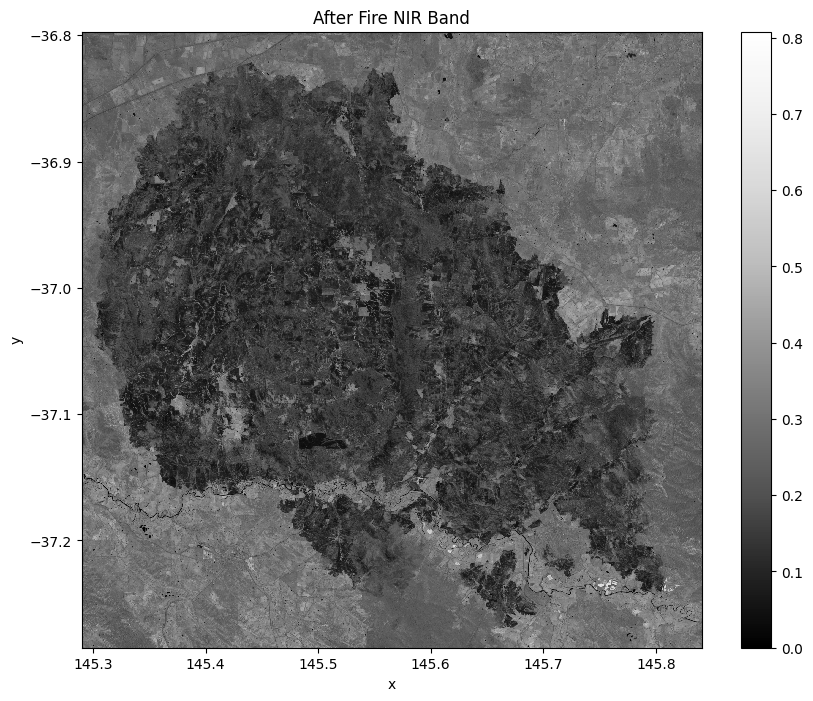

In [ ]:
# 1. Open the bands using rioxarray
# masked=True automatically handles the 'NoData' values using dataMask
nir_after = rxr.open_rasterio(after_paths[3], masked=True)
swir_after = rxr.open_rasterio(after_paths[4], masked=True)

# Visualize the NIR band
showBand(nir_after, "After Fire NIR Band")

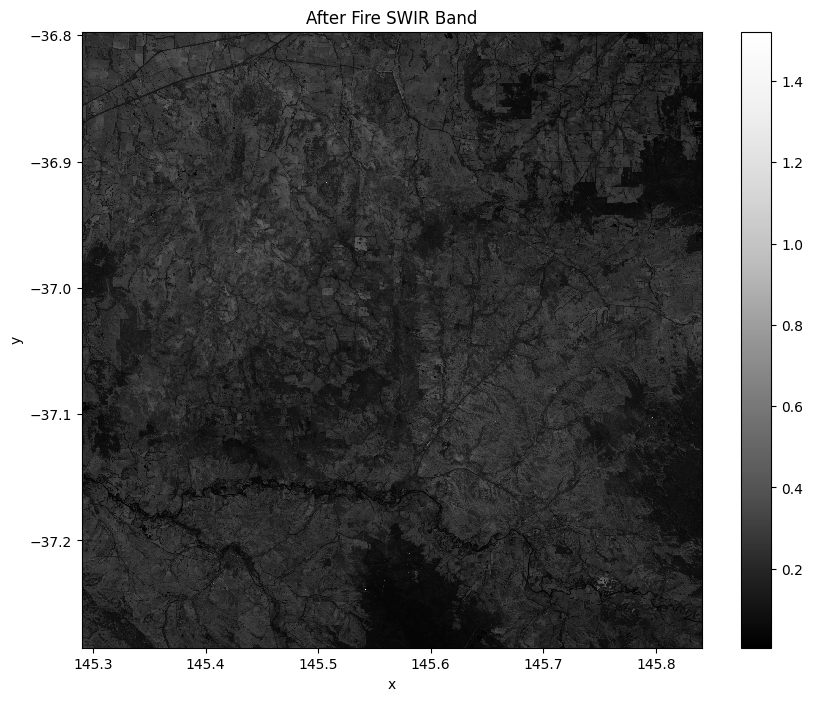

In [ ]:
# Visualize the SWIR band
showBand(swir_after, "After Fire SWIR Band")


('band', 'y', 'x')
<class 'xarray.core.dataarray.DataArray'>
After Shape: (1, 2500, 2252)


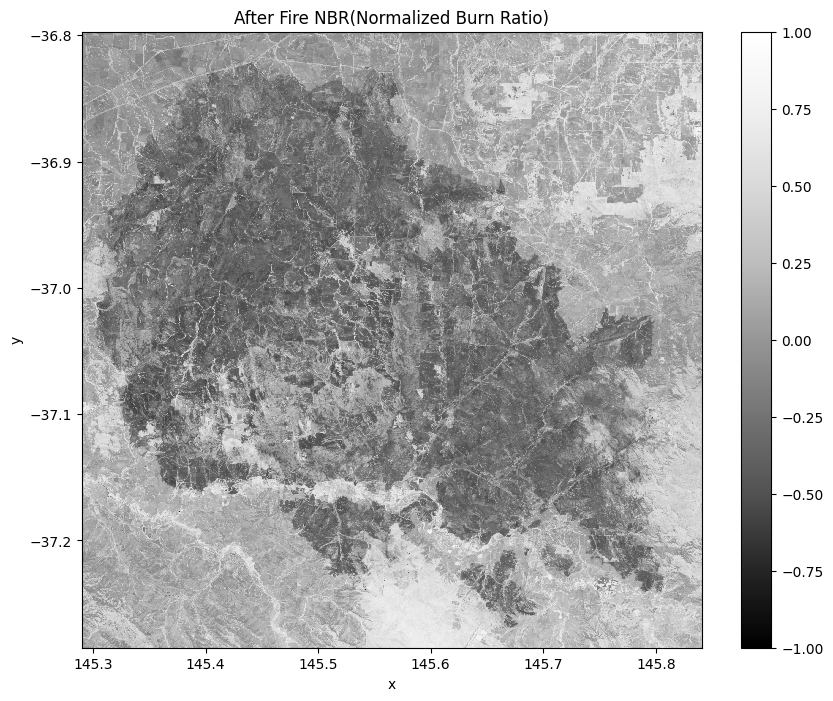

In [ ]:
# 2. Calculate NBR
# Formula: (NIR - SWIR) / (NIR + SWIR)
nbr_after = (nir_after - swir_after) / (nir_after + swir_after)
nbr_after = nbr_after.clip(min=-1, max=1)  # Clip values to the range [-1, 1]
print(nbr_after.dims)
print(type(nbr_after))
print("After Shape:", nbr_after.shape)

# Visualize the After fie NBR
showBand(nbr_after, "After Fire NBR(Normalized Burn Ratio)")

('band', 'y', 'x')
<class 'xarray.core.dataarray.DataArray'>
Before Shape: (1, 2500, 2252)


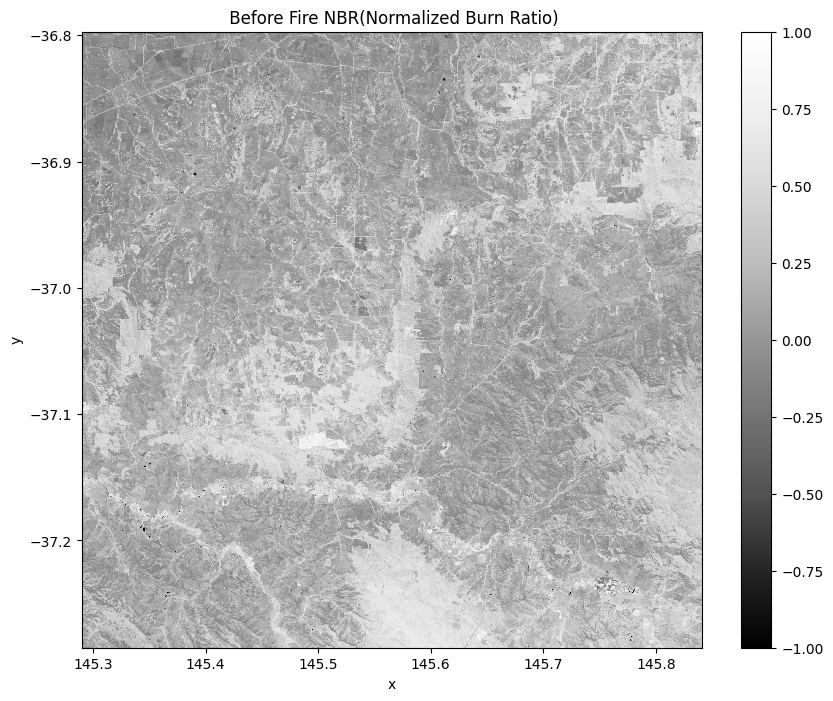

In [ ]:
#Now we repeat the NBR analysis for before fire imagery

# 1. Open the bands using rioxarray
# masked=True automatically handles the 'NoData' values using your dataMask
nir_before = rxr.open_rasterio(before_paths[3], masked=True)
swir_before = rxr.open_rasterio(before_paths[4], masked=True)

# 2. Calculate NBR
# Formula: (NIR - SWIR) / (NIR + SWIR)
nbr_before = (nir_before - swir_before) / (nir_before + swir_before)
nbr_before = nbr_before.clip(min=-1, max=1)  # Clip values to the range [-1, 1]
print(nbr_before.dims)
print(type(nbr_before))
print("Before Shape:", nbr_before.shape)

# Visualize the After fie NBR
showBand(nbr_before, " Before Fire NBR(Normalized Burn Ratio)")


(1, 2500, 2252)
(1, 2500, 2252)
Success: dNBR calculated.


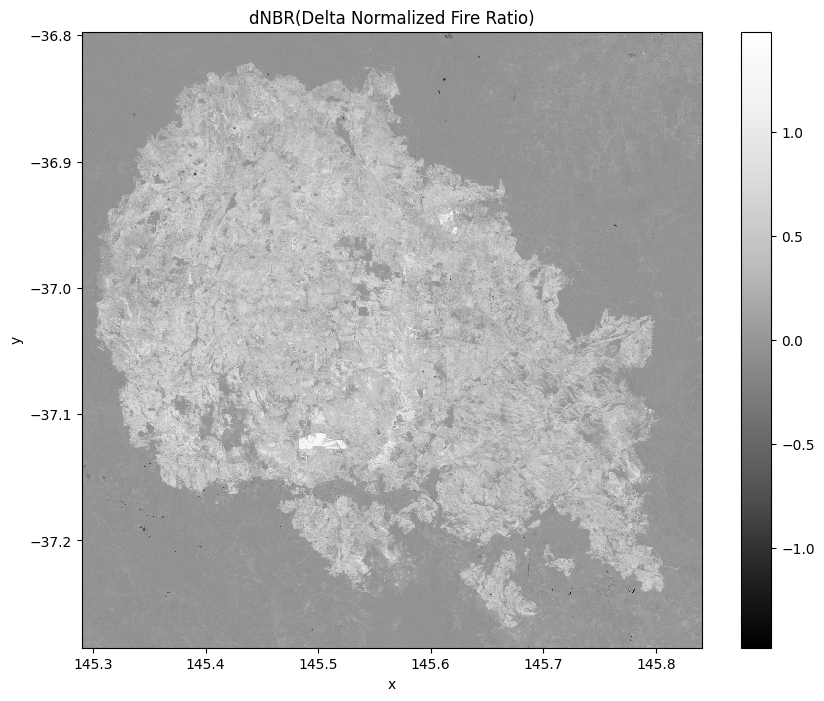

Before Bounds: (145.29007, -37.28497999999999, 145.84075899999996, -36.797189)
After Bounds:  (145.29007, -37.28497999999999, 145.84075899999996, -36.797189)


In [ ]:
# Calculate dNBR

#1. Check if both have same number of dimensions
print(nbr_before.shape)
print(nbr_after.shape)

#nbr_before has two bands, make sure to use the first one
#nbr_before_1 = nbr_before.sel(band=1)
#nbr_after_aligned = nbr_after.rio.reproject_match(nbr_before_1)

# 2. dNBR Formula
dnbr = nbr_before - nbr_after

# 3. Check if it's still empty
if dnbr.isnull().all():
    print("Error: The dNBR is still empty. Check if the images actually overlap geographically.")
else:
    print("Success: dNBR calculated.")

#4. Visualize dNBR
showBand(dnbr, 'dNBR(Delta Normalized Fire Ratio)')

print("Before Bounds:", nbr_before.rio.bounds())
print("After Bounds: ", nbr_after.rio.bounds())

##3. Burn severity classification and calculating land area impacted.

To accurately calculate the land area impacted by the fire, we must transform our data from a Geographic Coordinate System (WGS84 / EPSG:4326), which uses degrees, to a Projected Coordinate System (VicGrid2020 / EPSG:7899), which uses meters.

###Why use VicGrid2020 (EPSG:7899)?
While WGS84 is great for global mapping, its units are in degrees. Because the earth is curved, the distance represented by one degree changes depending on where you are. To get precise measurements in hectares, we use VicGrid2020, the official state-wide projection for Victoria. It is specifically designed to minimize distortion across the state and uses meters as its base unit, making area calculations straightforward:

1 Hectare = 10,000m2



In [ ]:
# Sometimes there maybe 2 bands but the second band is empty
dnbr_band = dnbr.sel(band=1)

# 1. Reproject the dNBR to VicGrid2020 (EPSG:7899)
# This converts the coordinates from Degrees to Meters
# Force the resolution to exactly 20m for higher precision
# Both Band12 SWIR and Band8A spatial resolution is 20m
dnbr_vicgrid = dnbr_band.rio.reproject("EPSG:7899", resolution=20)

# 2. Define the threshold for what is "burnt"
# (Pixels where NBR dropped by more than 0.1)
threshold = 0.1
burnt_mask = dnbr_vicgrid > threshold

# 3. Count only the 'True' pixels
burnt_pixel_count = int(burnt_mask.sum())

# 4. Get the resolution in meters
# Sentinel-2 B8A/B12 processed via rioxarray usually results in ~20m pixels
res_x, res_y = dnbr_vicgrid.rio.resolution()
pixel_area_m2 = abs(res_x * res_y)

# 5. Final Calculation
total_area_hectares = (burnt_pixel_count * pixel_area_m2) / 10000

print(f"Coordinate System: {dnbr_vicgrid.rio.crs}")
print(f"Pixel Resolution: {abs(res_x):.1f} meters")
print(f"Burnt Pixels counted: {burnt_pixel_count}")
print(f"------------------------")
print(f"Total Fire Scar Area: {total_area_hectares:.2f} hectares")

Coordinate System: EPSG:7899
Pixel Resolution: 20.0 meters
Burnt Pixels counted: 3111647
------------------------
Total Fire Scar Area: 124465.88 hectares


In [ ]:
# Calculate how many pixels were skipped due to clouds/NaNs
total_pixels = dnbr_vicgrid.size
valid_pixels = dnbr_vicgrid.count().item()
missing_pixels = total_pixels - valid_pixels
missing_area_ha = (missing_pixels * pixel_area_m2) / 10000

print(f"Area unreadable (clouds/NaN): {missing_area_ha:.2f} hectares")

Area unreadable (clouds/NaN): 3258.96 hectares


In [ ]:
# # Calculate pixel area (e.g., 20m * 20m = 400m2)
pixel_area_m2 = float(dnbr_vicgrid.rio.resolution()[0]**2)
#print(pixel_area_m2 )

# 1. Define Severity Masks
high  = (dnbr_vicgrid >= 0.66).sum() * pixel_area_m2 / 10000
mod   = ((dnbr_vicgrid >= 0.27) & (dnbr_vicgrid < 0.66)).sum() * pixel_area_m2 / 10000
low   = ((dnbr_vicgrid >= 0.1) & (dnbr_vicgrid < 0.27)).sum() * pixel_area_m2 / 10000

# Calculate Total Footprint (Sum of all burnt classes)
total_burnt_area = float(high + mod + low)

# 2. Print Report
print(f"--- LONGWOOD FIRE SEVERITY REPORT (USGS STANDARDS) ---")
print(f"High Severity:          {float(high):,.2f} ha")
print(f"Moderate Severity:      {float(mod):,.2f} ha")
print(f"Low Severity:           {float(low):,.2f} ha")
print(f"------------------------------------------------------")
print(f"TOTAL BURNT FOOTPRINT:  {total_burnt_area:,.2f} ha")

--- LONGWOOD FIRE SEVERITY REPORT (USGS STANDARDS) ---
High Severity:          5,410.48 ha
Moderate Severity:      89,029.76 ha
Low Severity:           30,025.64 ha
------------------------------------------------------
TOTAL BURNT FOOTPRINT:  124,465.88 ha


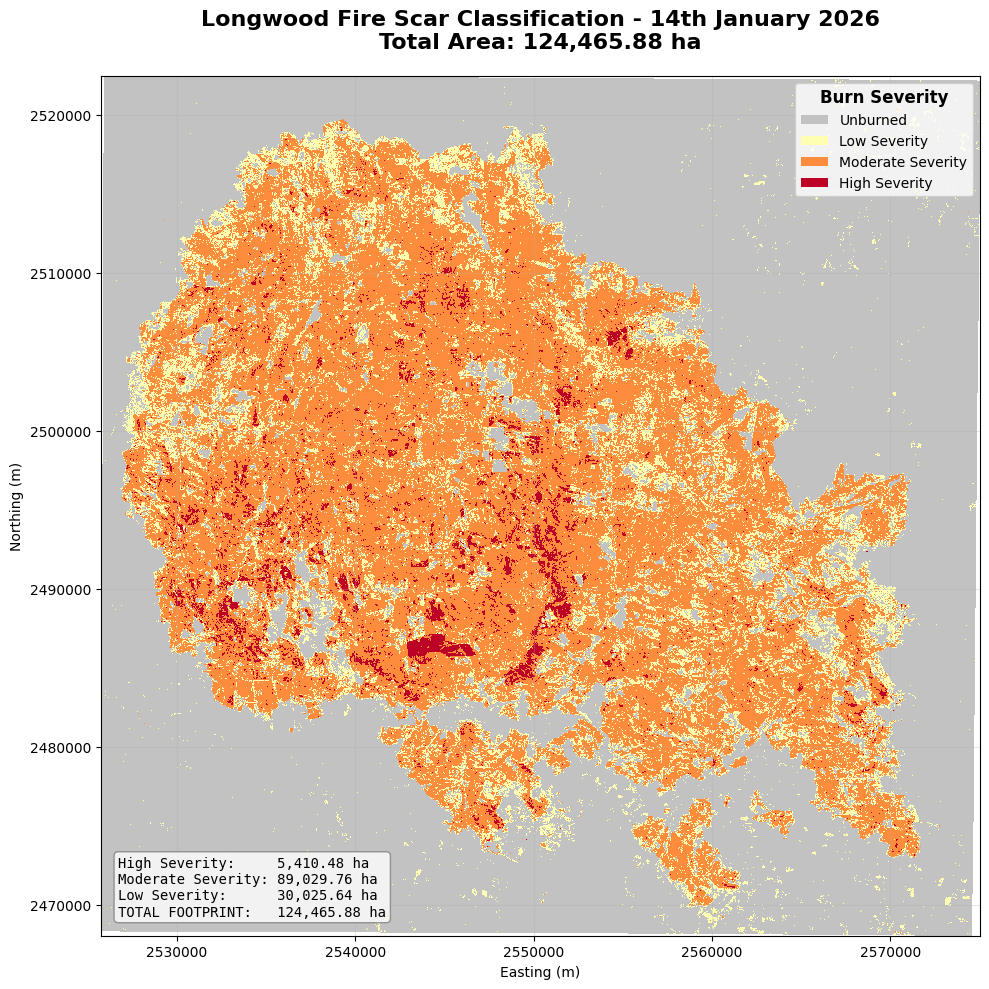

In [ ]:
import matplotlib.colors as mcolors
from matplotlib.patches import Patch





# 1. Define the severity bins and colors based on USGS table
# Thresholds: <0.1, 0.1-0.27, 0.27-0.66, >=0.66
levels = [-1, 0.10, 0.27, 0.66, 1.5]
colors = ['#c2c2c2', '#ffffb2', '#fd8d3c', '#bd0026']
labels = ['Unburned','Low Severity','Moderate Severity','High Severity'
]

# 2. Create the colormap and normalization
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(levels, cmap.N)

# 3. Plotting
fig, ax = plt.subplots(1, 1, figsize=(10, 10)) # Increased height slightly for clarity

im = dnbr_vicgrid.plot.imshow(
    ax=ax,
    cmap=cmap,
    norm=norm,
    add_colorbar=False
)

#4. Add a Custom Legend
legend_elements = [Patch(facecolor=colors[i], label=labels[i]) for i in range(len(colors))]
leg = ax.legend(handles=legend_elements, loc='upper right', title="Burn Severity")

# Update legend title style
plt.setp(leg.get_title(), fontweight='bold', fontsize=12)

# --- NEW: Create and Add the Subtitle Textbox ---
report_text = (
    f"High Severity:     {float(high):,.2f} ha\n"
    f"Moderate Severity: {float(mod):,.2f} ha\n"
    f"Low Severity:      {float(low):,.2f} ha\n"
    f"TOTAL FOOTPRINT:   {total_area_hectares:,.2f} ha"
)

# We place this in the bottom-left (0.02, 0.02) using axis coordinates
ax.text(0.02, 0.02, report_text,
        transform=ax.transAxes,
        fontsize=10,
        family='monospace', # Keeps columns aligned
        verticalalignment='bottom',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray'))

# 5. Formatting
ax.set_title(f"Longwood Fire Scar Classification - 14th January 2026\nTotal Area: {total_area_hectares:,.2f} ha",
             fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")
ax.grid(alpha=0.3)
plt.ticklabel_format(style='plain', axis='both')

plt.tight_layout()
plt.show()


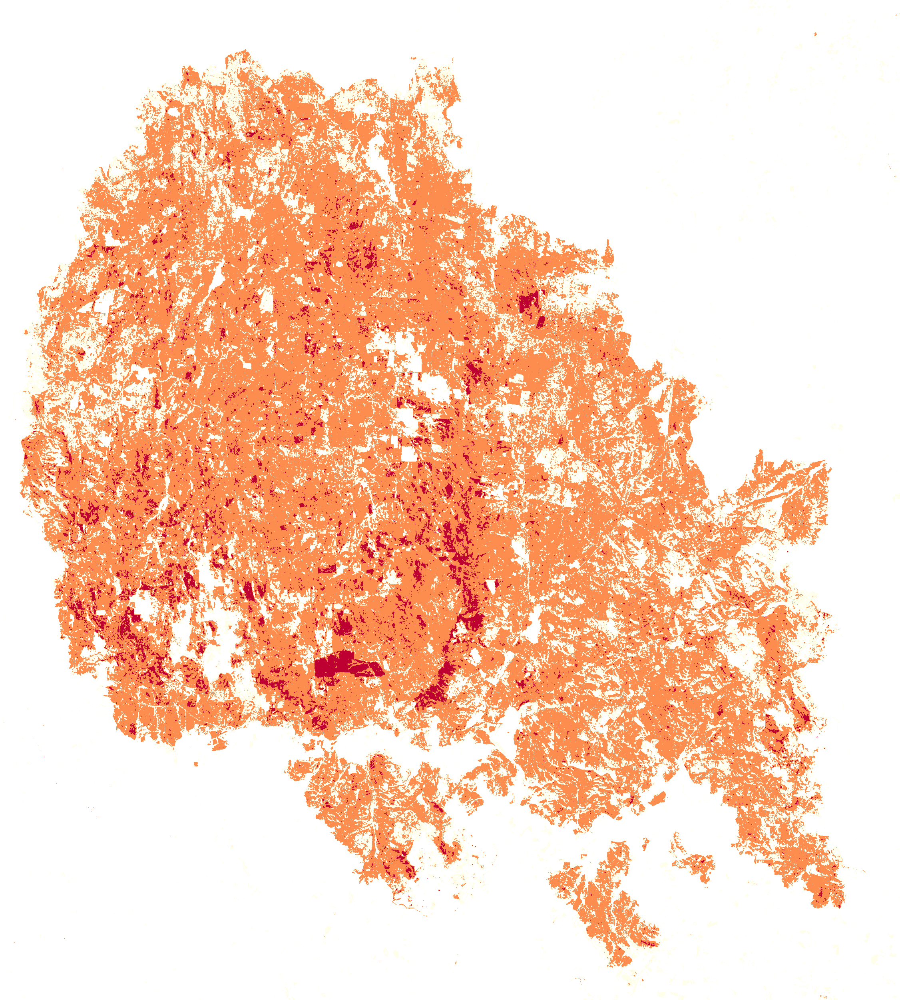

In [ ]:
# Visualize and save this as a folium map
import folium
from matplotlib.colors import ListedColormap, BoundaryNorm

# 1.Use the dnbr_band in Folium as it is already in EPSG:4326 projection that folium uses

# 2. Get bounds and center
bounds = [
    [dnbr_band.y.min().item(), dnbr_band.x.min().item()],
    [dnbr_band.y.max().item(), dnbr_band.x.max().item()]
]
center_lat = dnbr_band.y.mean().item()
center_lon = dnbr_band.x.mean().item()

# 3. Initialize Map with Satellite Background
m = folium.Map(location=[center_lat, center_lon], zoom_start=11, tiles='CartoDB Positron')
# Add ESRI Satellite Imagery
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Satellite Imagery',
    overlay=False,
    control=True
).add_to(m)

# Add ESRI Labels & Roads (The "Hybrid" part)
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/Reference/World_Boundaries_and_Places/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Towns & Roads',
    overlay=True, # This sits ON TOP of everything
    control=True,
    zindex=10 # Ensures labels stay above the burn scar
).add_to(m)

# 4. Prepare Burn Severity Overlay
# Update Colormap and Norm for 4 classes
colors_folium = ['#c2c2c200', '#ffffb2', '#fd8d3c', '#bd0026']
levels = [-1, 0.1, 0.27, 0.66, 1.5]

cmap_folium = ListedColormap(colors_folium)
norm = BoundaryNorm(levels, cmap_folium.N)

# 2. Prepare RGBA Data
data_array = dnbr_band.values
rgba_data = cmap_folium(norm(data_array))
rgba_data[np.isnan(data_array), 3] = 0  # Ensure NaNs are transparent

# 3. Add Burn Severity Overlay
folium.raster_layers.ImageOverlay(
    image=rgba_data,
    bounds=bounds,
    opacity=0.6,
    name="Fire Severity Scar",
    interactive=True,
    zindex=1
).add_to(m)

# 4. HTML Legend with 4 Classes
legend_html = f'''
     <div style="position:absolute; bottom:20px; left:20px; width:auto; min-width:220px; height:auto;
     border:2px solid grey; z-index:9999; font-size:12px; background-color:white;
     opacity: 0.9; padding: 10px; font-family: sans-serif; border-radius:5px;">
     <b>Burn Severity</b><br>
     <i style="background:#bd0026; width:12px; height:12px; display:inline-block"></i> High (> 0.66): {float(high):,.1f} ha<br>
     <i style="background:#fd8d3c; width:12px; height:12px; display:inline-block"></i> Moderate (0.27-0.66): {float(mod):,.1f} ha<br>
     <i style="background:#ffffb2; width:12px; height:12px; display:inline-block"></i> Low (0.15-0.26): {float(low):,.1f} ha<br>
     <hr style="margin: 5px 0">
     <b>TOTAL BURNT: {total_burnt_area:,.1f} ha</b>
     </div>
     '''
m.get_root().html.add_child(folium.Element(legend_html))

# 5. Add the Layer Control Panel (This brings back the missing menu)
folium.LayerControl(collapsed=False).add_to(m)

# 6. Save the map to an HTML file
m.save("output/Longwood_Bushfire_Analysis_2026.html")

m

## 4. Analysing impact on properties and buildings

To quantify the human impact of the fire, we integrate official VicMap Property and VicMap Building datasets. By using the spatial extent (bounding box) of our after-fire Sentinel-2 imagery, we extract the relevant data for the Longwood region. When downloading the data, make sure to choose the VicGrid2020 projection.

Since both the property and building datasets are vector polygons, we transform them into a raster format that matches the 20m resolution of our burn scar. This allows for a direct pixel-level overlay analysis, enabling us to identify exactly which land parcels and structures intersect with burn areas.

In [ ]:
# 2. Correct the path (ensure MyDrive is one word)
property_file_path = '/content/drive/MyDrive/longwood_fires3/property/'
buildings_file_path = '/content/drive/MyDrive/longwood_fires3/buildings/'

property_file_name = ['PROPERTY_VIEW.shp']
buildings_file_name = ['BUILDING_POLYGON.shp']

p_paths = checkFilePaths(property_file_name,property_file_path )
b_paths = checkFilePaths(buildings_file_name,buildings_file_path )


Found: PROPERTY_VIEW.shp
Found: BUILDING_POLYGON.shp


In [ ]:
# Display buildings and property layer in map
# Read the shapefile
properties_gdf = gpd.read_file(p_paths[0])

# Display the first few rows to verify
print(properties_gdf.shape)
print("Projection: ", properties_gdf.crs)
properties_gdf.head()


(10886, 12)
Projection:  EPSG:7899


,UFI,PFI,BASE_PFI,C_PFI,STATUS,GRAPH_TYPE,Z_LEVEL,TASK_ID,PFI_CR,UFI_OLD,UFI_CR,geometry
0,809507257,1061925,None,127738725,A,P,G,1008.0,NaT,806800671.0,2023-11-05,"MULTIPOLYGON (((2544191.735 2464659.111, 25443..."
1,801320861,960724,None,126573571,A,P,G,409767.0,NaT,415921236.0,2023-09-27,"POLYGON ((2575748.978 2492424.207, 2575560.876..."
2,806793505,2077606,None,127740885,A,P,G,411975.0,NaT,576872524.0,2023-10-22,"MULTIPOLYGON (((2555208.19 2502093.523, 255520..."
3,806793508,131847058,None,131865779,A,P,G,411975.0,2011-01-24,415106229.0,2023-10-22,"MULTIPOLYGON (((2550287.149 2502277.58, 255029..."
4,806799522,1062755,None,127735534,A,P,G,411975.0,NaT,548425318.0,2023-10-22,"MULTIPOLYGON (((2541474.637 2472946.09, 254136..."


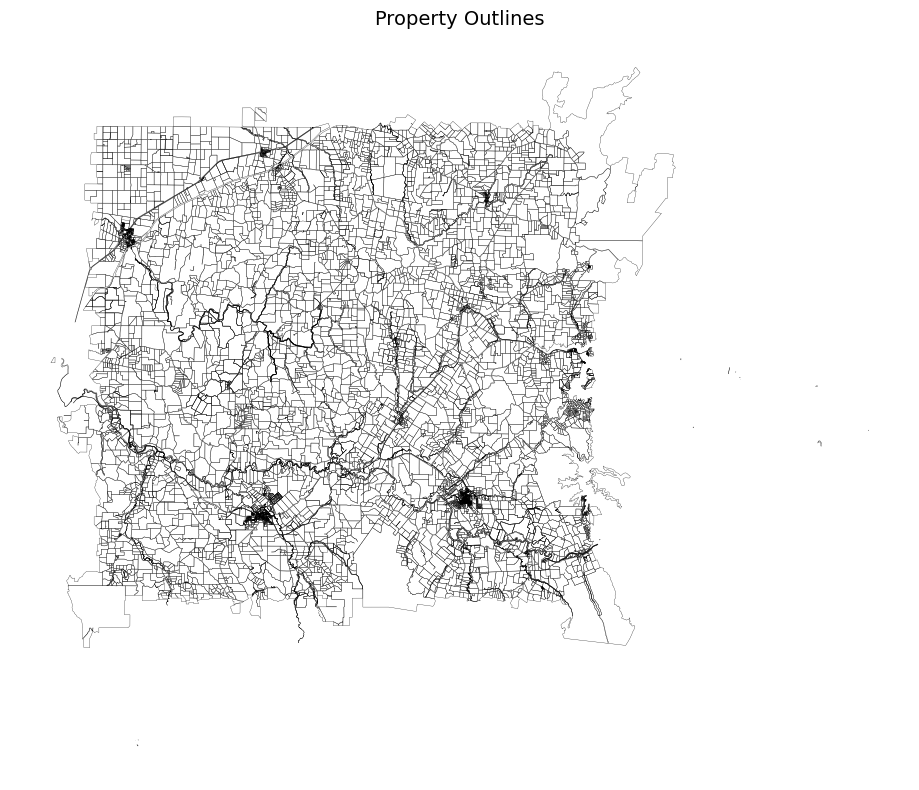

In [ ]:
# Plot just the outlines
# facecolor='none' makes the polygon transparent
# edgecolor defines the color of the lines (e.g., 'black', 'blue', or 'white')
# linewidth adjusts the thickness of the property boundaries
fig, ax = plt.subplots(figsize=(10, 8))

properties_gdf.plot(ax=ax,facecolor='none', edgecolor='black', linewidth=0.2)
# Hide the axis lines, ticks, and labels
ax.set_axis_off()
ax.set_title("Property Outlines", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# Read the buildings shapefile
buildings_gdf = gpd.read_file(b_paths[0])

# Display the first few rows to verify
print(buildings_gdf.shape)
buildings_gdf.head()


(171, 14)


,UFI,PFI,FTYPE,FEATSUBTYP,STATE,AUTHORGC,AUTHORGID,AUTHORGVER,CRDATE_PFI,SUPER_PFI,CRDATE_UFI,FEATURE_UF,FEATURE_CR,geometry
0,75174840,7748,building,undefined_building,VIC,None,None,NaT,2009-05-20,NaN,2025-11-25,75174840,2025-11-25,"POLYGON ((2517497.475 2519335.344, 2517497.475..."
1,75174835,891447,building,undefined_building,VIC,None,None,NaT,2011-06-10,NaN,2025-11-25,75174835,2025-11-25,"POLYGON ((2517668.357 2519364.547, 2517668.024..."
2,75174836,7745,building,undefined_building,VIC,None,None,NaT,2009-05-20,NaN,2025-11-25,75174836,2025-11-25,"POLYGON ((2517497.808 2519362.711, 2517497.809..."
3,75174839,891448,building,undefined_building,VIC,None,None,NaT,2011-06-10,NaN,2025-11-25,75174839,2025-11-25,"POLYGON ((2517668.357 2519336.345, 2517668.357..."
4,75174855,891449,building,undefined_building,VIC,None,None,NaT,2011-06-10,NaN,2025-11-25,75174855,2025-11-25,"POLYGON ((2539216.617 2518849.668, 2539215.21 ..."


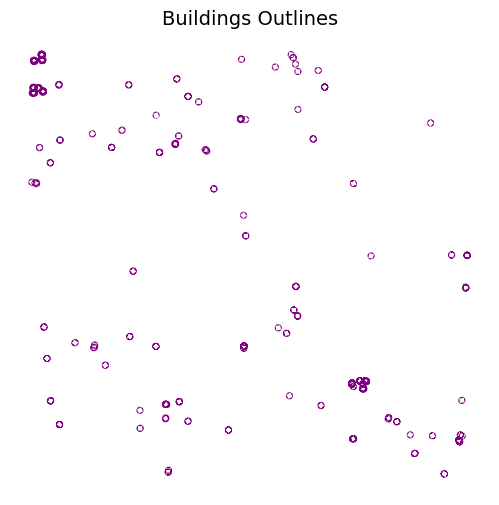

In [ ]:
# Display buildings, exxagerate them so that they are visible

fig, ax = plt.subplots(figsize=(8, 6))
buildings_gdf.plot(ax=ax,facecolor='none', edgecolor='purple', linewidth=5)
# Hide the axis lines, ticks, and labels
ax.set_axis_off()
ax.set_title("Buildings Outlines", fontsize=14)
plt.show()

Convert the "Burnt" area (everything above 0.10) into a single "Burn Footprint" polygon, then count how many buildings and properties fall inside it.

In [ ]:
# 1. Prepare the data
# We only care about pixels >= 0.1
# Let's create a simple binary mask: 1 = Burnt, 0 = Unburnt
burnt_mask = (dnbr_vicgrid.values >= 0.1).astype('int16')

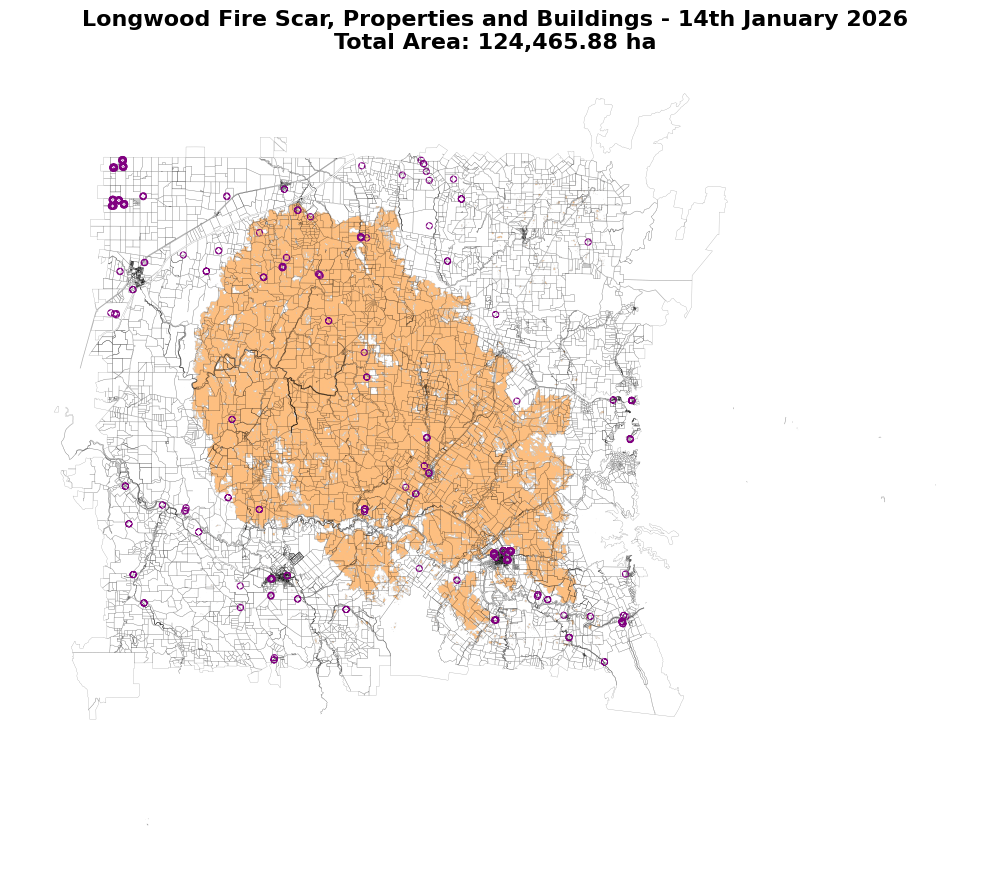

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# --- PLOT 1: The Burnt Mask Raster ---
# We mask out the '0' values (unburnt) so they are transparent.
# This lets the background show through and only highlights the fire scar.
masked_mask = np.where(burnt_mask == 1, 1, np.nan)

# Use 'rio.bounds' to ensure it aligns perfectly with the GDFs
extents = [dnbr_vicgrid.x.min(), dnbr_vicgrid.x.max(), dnbr_vicgrid.y.min(), dnbr_vicgrid.y.max()]

ax.imshow(
    masked_mask,
    extent=extents,
    cmap='Wistia_r',
    alpha=0.5
)

# --- PLOT 2: The Property Outlines ---
properties_gdf.plot(
    ax=ax,
    facecolor='none',
    edgecolor='black',
    linewidth=0.2,
    alpha=0.4
)

# --- PLOT 3: The Buildings Outlines ---
# Changed linewidth to 1.5; 5 is usually too thick and blobs the map
buildings_gdf.plot(
    ax=ax,
    facecolor='purple',
    edgecolor='purple',
    linewidth=5,
    alpha=1.0
)

# Formatting & Hiding Axis
ax.set_title(
    f"Longwood Fire Scar, Properties and Buildings - 14th January 2026\n"
    f"Total Area: {total_burnt_area:,.2f} ha",
    fontsize=16, fontweight='bold'
)

ax.set_axis_off()
plt.tight_layout()
plt.show()

In [ ]:
from rasterstats import zonal_stats
import pandas as pd

# 1. SPATIAL ANALYSIS (ZONAL STATS) ---
affine = dnbr_vicgrid.rio.transform()

# 2. Run Zonal Stats for Buildings
# 'sum' will tell us how many burnt pixels are inside the building footprint
b_stats = zonal_stats(
    buildings_gdf,
    burnt_mask,
    affine=affine,
    stats="sum",
    nodata=-999
)

# 3. Run Zonal Stats for Properties
p_stats = zonal_stats(
    properties_gdf,
    burnt_mask,
    affine=affine,
    stats="sum",
    nodata=-999
)

# 4. Count those where sum > 0 (meaning at least one burnt pixel was touched)
affected_buildings_count = sum(1 for x in b_stats if x['sum'] is not None and x['sum'] > 0)
affected_properties_count = sum(1 for x in p_stats if x['sum'] is not None and x['sum'] > 0)


# 5. Attach the zonal stats 'sum' back to the GeoDataFrame
properties_gdf['burnt_pixel_count'] = [x['sum'] for x in p_stats]

# 6. Group by Property PFI to aggregate multiple parcels into one property
# We sum the burnt pixels and keep the first geometry
aggregated_properties = properties_gdf.groupby('PFI').agg({
    'burnt_pixel_count': 'sum',
    'geometry': 'first'
}).reset_index()

# 7. Filter for properties that actually have a burn signature
final_impacted_properties = aggregated_properties[aggregated_properties['burnt_pixel_count'] > 0]

print(f"Aggregated Unique Properties Affected: {len(final_impacted_properties)}")
print(f"Total Buildings Impacted: {affected_buildings_count}")

Aggregated Unique Properties Affected: 2945
Total Buildings Impacted: 12


##5. Visualization results through interactive mapping with Folium.

Verified Totals:
Properties Impacted: 2945
Buildings Impacted: 12



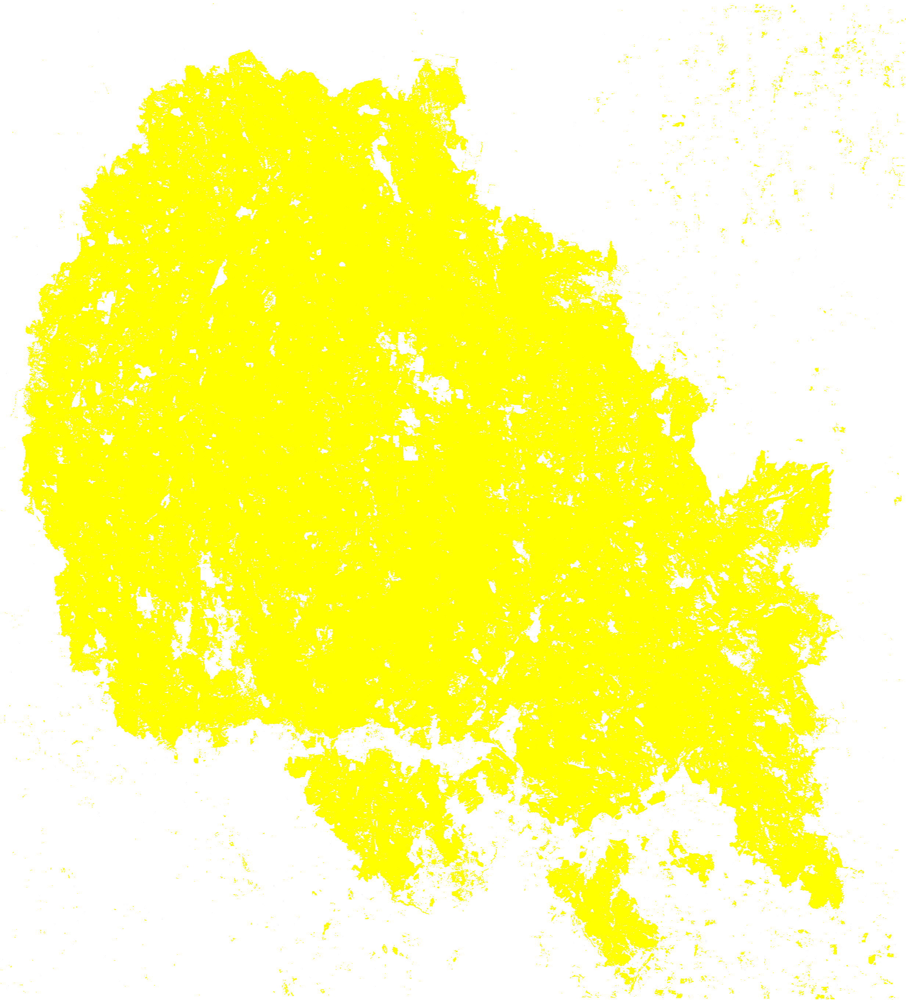

In [ ]:
from folium import plugins
from rasterstats import zonal_stats

# Filter Buildings: Only affected ones
final_impacted_buildings = buildings_gdf[
    (buildings_gdf['burnt_pixel_count'].notnull()) & (buildings_gdf['burnt_pixel_count'] > 0)
].copy()


# SANITIZE DATA (FIX TIMESTAMP ERROR) ---
# Function to convert Timestamps to strings to avoid JSON serialization errors
def sanitize_for_folium(gdf):
    for col in gdf.columns:
        if pd.api.types.is_datetime64_any_dtype(gdf[col]):
            gdf[col] = gdf[col].astype(str)
    return gdf

final_impacted_buildings = sanitize_for_folium(final_impacted_buildings)
final_impacted_properties = sanitize_for_folium(final_impacted_properties)

# REPROJECTION FOR FOLIUM ---
props_map_data = final_impacted_properties.to_crs(epsg=4326)
builds_map_data = final_impacted_buildings.to_crs(epsg=4326)

# Get Map Bounds from Raster
wgs84_rio = dnbr_vicgrid.rio.reproject("EPSG:4326")
b = wgs84_rio.rio.bounds()
folium_bounds = [[b[1], b[0]], [b[3], b[2]]]

# VISUALIZATION PREP ---
# Create Vivid Orange Fire Scar
rgba_data = np.zeros((burnt_mask.shape[0], burnt_mask.shape[1], 4))
rgba_data[burnt_mask == 1] = [1.0, 0.5, 0.0, 0.5]

build_color = '#FF0000'
prop_color = '#9400D3'

# --- STEP 6: CREATE THE MAP ---
m = folium.Map(
    location=[(b[1] + b[3]) / 2, (b[0] + b[2]) / 2],
    zoom_start=10,
    tiles='cartodbpositron',
    control_scale=True
)

plugins.Fullscreen(position='topright').add_to(m)

# 1. Add Fire Scar
folium.raster_layers.ImageOverlay(
    image=rgba_data,
    bounds=folium_bounds,
    name="Fire Scar Footprint",
    zindex=1
).add_to(m)

# 2. Add IMPACTED Properties
folium.GeoJson(
    props_map_data,
    name="Impacted Properties",
    style_function=lambda x: {
        'fillColor':prop_color,
        'color': prop_color,
        'weight': 1,
        'fillOpacity': 0.2
    },
    highlight_function=lambda x: {'weight': 4, 'color': 'green', 'fillOpacity': 0.6},
    tooltip=folium.features.GeoJsonTooltip(
        fields=['PFI', 'burnt_pixel_count'],
        aliases=['Property ID:', 'Burnt Pixels:'],
        sticky=True
    )
).add_to(m)

# 3. Add IMPACTED Buildings
folium.GeoJson(
    builds_map_data,
    name="Impacted Buildings",
    style_function=lambda x: {
        'fillColor': build_color,
        'color': build_color,
        'weight': 10,
        'fillOpacity': 1.0
    },
    tooltip=folium.Tooltip("Affected Building structure", sticky=True)
).add_to(m)

# 4. Add Custom Floating Legend
legend_html = f'''
     <div style="position: fixed; bottom: 50px; left: 50px; width: 200px; height: 110px;
     background-color: white; z-index:9999; border:2px solid black; border-radius:6px;
     padding: 10px; font-size:12px; font-weight:bold; box-shadow: 2px 2px 5px rgba(0,0,0,0.2);">
     <b>FIRE IMPACT ANALYSIS</b><br>
     <i style="background:rgba(255, 90, 0, 0.65); width:12px; height:12px; float:left; margin-right:5px; border:1px solid orange;"></i> Fire Scar Area<br>
     <i style="background:{prop_color}; width:12px; height:12px; float:left; margin-right:5px; opacity:0.6;"></i> Affected Property<br>
     <i style="background:{build_color}; width:12px; height:12px; float:left; margin-right:5px; border:1px solid black;"></i> Affected Building
     </div>
     '''
m.get_root().html.add_child(folium.Element(legend_html))

folium.LayerControl(collapsed=False).add_to(m)

# Summary Output
print(f"Verified Totals:")
print(f"Properties Impacted: {len(final_impacted_properties)}")
print(f"Buildings Impacted: {len(final_impacted_buildings)}")

m

In [ ]:
#Save the map to an HTML file
m.save("output/Longwood_Bushfire_Analysis_Properties_2026.html")


## Conclusion
The calculated burn area and property counts align with official figures. However, the building impact count is likely an underestimation due to known gaps in the Vic Buildings dataset. It is also important to note that the 2,945 properties identified include any land parcel with even a single pixel of burn signature, representing a highly inclusive "maximum impact" footprint. While the property analysis seems accurate, the structural losses should be viewed as a conservative estimate based on available data.